# Spy analysis:

- About the data:
  
    -  The dataset contains over thirty years of daily SPY values from its inception in Jan 1993 to the end of Sept 2024.
    -  In this analysis we won't be adjusting the data for inflation, so the data has a deterministic trend. Inflation adjusted one has a stochastic trend.

## Load the libraries:
    Here we load the libraries that we are going to be using throughout the project.

In [51]:
import polars as pl # Memory? What is that? We borrow.
import pandas as pd # Pandas for some of the libraries that doesn't support polars.
import matplotlib.pyplot as plt # For visualizing.
import math # For the built in math functions.
import seaborn as sns # For visualizing.
import numpy as np # For linear algebra
import pandas_market_calendars as mcal # For accurate trading days.
from pandas.plotting import autocorrelation_plot # ACF plot.

from scipy.stats import boxcox # Box-Cox transformation

# Anomaly detection.
from adtk.data import validate_series
from adtk.visualization import plot
from adtk.transformer import ClassicSeasonalDecomposition
from adtk.detector import ThresholdAD, SeasonalAD

exec(open('hegy.py', 'r').read())
from hegy import hegy_test

# Statsmodels for statistical analysis and forecasting.
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import het_arch
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.statespace.sarimax import SARIMAX

from jormund import * # Personal library.
setup_plots() # To make the graphs look better.

import gc # garbage collection

# To ignore the annoying warnings.
import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn

%matplotlib inline

## Load the data and adjust datetime:
    Here we load the dataset and then make the string 'Date' column a datetime column 'date'. This way it will be easier to work on the dataset.

In [6]:
spy = pl.read_csv('spy.csv')
spy = spy.with_columns([
    pl.col("Date").str.strptime(pl.Date, "%Y-%m-%d").alias("date")
])
spy = spy.drop('Date')

## Seperate the data:
    Here we seperate the data into train and test dataframes so that there is no leak while we are analyzing the data.

In [7]:
train = spy.filter(pl.col("Year") < 2024).drop(['Open', 'High', 'Low', 'Volume'])
test = spy.filter(pl.col("Year") == 2024).drop(['Open', 'High', 'Low', 'Volume'])

    - train: the data we will be analyzing (i.e. train + validation + test).
    - test: the final data we will be testing the time series model on (i.e. holdout).

Since we are analyzing both the validation and the test parts along with the train part this introduces a bias toward it, although not very significant we should still try to avoid using them together when using them in the future.

## Visualization:
- In this step we will be interpreting the data using:
  - The starting date and the ending date for the dataset.
  - The frequency of the data.
  - Visualizing to see trend and seasonality.
  - Visualizing for stationarity.

In [45]:
train.head(10).to_pandas().T

,0,1,2,3,4,5,6,7,8,9
Close,24.608625,24.783648,24.836166,25.098698,25.203728,25.186205,25.186205,25.011187,25.046185,25.168703
Day,29,1,2,3,4,5,8,9,10,11
Weekday,4,0,1,2,3,4,0,1,2,3
Week,4,5,5,5,5,5,6,6,6,6
Month,1,2,2,2,2,2,2,2,2,2
Year,1993,1993,1993,1993,1993,1993,1993,1993,1993,1993
date,1993-01-29 00:00:00,1993-02-01 00:00:00,1993-02-02 00:00:00,1993-02-03 00:00:00,1993-02-04 00:00:00,1993-02-05 00:00:00,1993-02-08 00:00:00,1993-02-09 00:00:00,1993-02-10 00:00:00,1993-02-11 00:00:00


In [43]:
train.to_pandas().memory_usage(deep=True).T / 1e3 # KB

Index       0.132
Close      62.288
Day        62.288
Weekday    62.288
Week       62.288
Month      62.288
Year       62.288
date       62.288
dtype: float64

In [32]:
print('Train \n start date: ', train['date'][0], "\n end date: ", train['date'][-1])
print('\nTest \n start date: ', test['date'][0], "\n end date: ", test['date'][-1])

Train 
 start date:  1993-01-29 
 end date:  2023-12-29

Test 
 start date:  2024-01-02 
 end date:  2024-09-30


In [7]:
train.describe().to_pandas().T

,0,1,2,3,4,5,6,7,8
statistic,count,null_count,mean,std,min,25%,50%,75%,max
Close,7786.0,0.0,140.733168,111.387159,24.311077,69.957664,92.607559,179.530319,472.236877
Day,7786.0,0.0,15.734652,8.75388,1.0,8.0,16.0,23.0,31.0
Weekday,7786.0,0.0,2.021577,1.399623,0.0,1.0,2.0,3.0,4.0
Week,7786.0,0.0,26.684819,14.935152,1.0,14.0,27.0,40.0,53.0
Month,7786.0,0.0,6.556512,3.421636,1.0,4.0,7.0,10.0,12.0
Year,7786.0,0.0,2008.026586,8.927004,1993.0,2000.0,2008.0,2016.0,2023.0
date,7786,0,2008-07-12 05:16:04.500000,None,1993-01-29,2000-10-12,2008-07-15,2016-04-07,2023-12-29


In [28]:
frequency = spy.select(
    (pl.col("date").diff()).alias("frequency")
)
frequency.to_pandas().T

,0,1,2,3,4,5,6,7,8,9,...,7964,7965,7966,7967,7968,7969,7970,7971,7972,7973
frequency,NaT,3 days,1 days,1 days,1 days,1 days,3 days,1 days,1 days,1 days,...,1 days,1 days,1 days,1 days,3 days,1 days,1 days,1 days,1 days,3 days


In [29]:
del frequency

In [6]:
len(spy.filter(pl.col('Year') == 2000)) # 2000 has no significance just chosen randomly

252

    - There are no missing values in both the date and the target columns.
    - Although the data is a daily data the frequency is 252 that is because the stock exchange is only open at weekdays and closed in weekends.

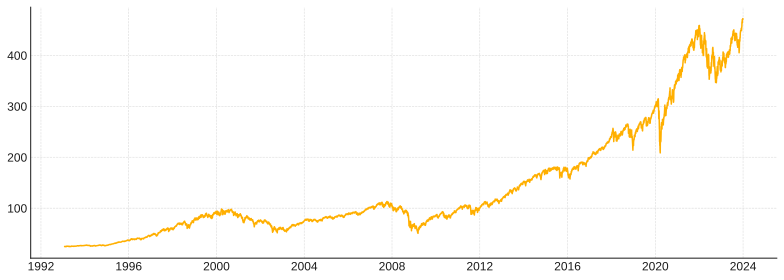

In [22]:
plt.figure(figsize=(11, 4))
plt.plot(train['date'], train['Close'])
plt.tight_layout()
plt.show()

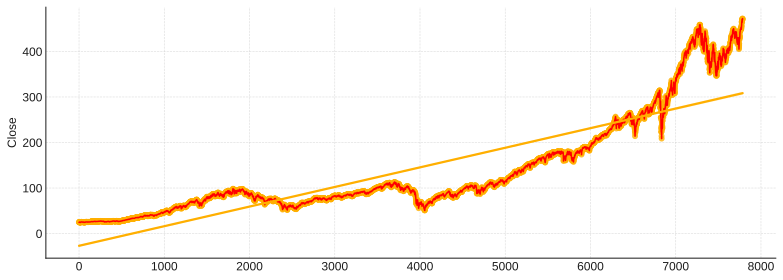

In [149]:
# Plot rolling statistics
plt.figure(figsize=(11, 4))
plt.plot(range(len(train)), train['Close'].to_pandas(), color='red')
sns.regplot(x=np.array(range(len(train))), y=train['Close'].to_pandas())
plt.tight_layout()
plt.show()

    - From the graph it is clearly seen that the graph has an upward deterministic trend. So this data is probably not stationary but let's take a look at the acf plots and make sure that it is not stationary.
    - There doesn't seem to be a outliers from this graph.
    - It seems like there is seasonality to the data. The seasonality can be seen clearly until around 2010 but after that it still shows the same behaviour only this time it is values themselvesd are a lot bigger so the seasonality looks like it ended.

## Box-Cox:
    - Here we will be analyzing the data to see if we need to apply the Box-Cox transformation and if we need to apply it, apply it.

In [9]:
# Rolling mean and standard deviation
rolling_mean = train['Close'].to_pandas().rolling(window=100).mean()
rolling_std = train['Close'].to_pandas().rolling(window=100).std()

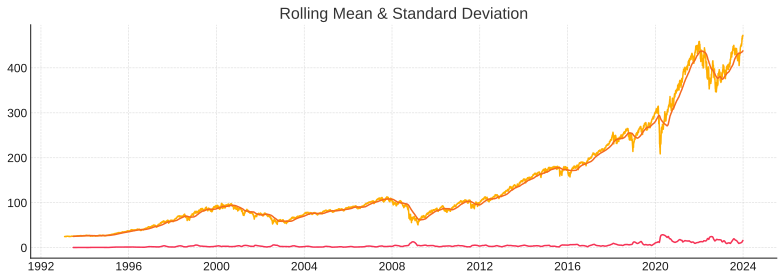

In [10]:
# Plot rolling statistics
plt.figure(figsize=(11, 4))
plt.plot(train['date'], train['Close'], label='Original Series')
plt.plot(train['date'], rolling_mean, label='Rolling Mean')
plt.plot(train['date'], rolling_std, label='Rolling Std')
plt.title('Rolling Mean & Standard Deviation')
plt.tight_layout()
plt.show()

    - It looks like variance isn't much dependent on the time. So we might not need to use the Box-Cox transformation.
    - Still we should take a look at the infromation criterion values to be sure that we do not need to transform the data.

In [29]:
arch_test = het_arch(train['Close'])
print('ARCH Test:')
print(f'LM Statistic: {arch_test[0]},\np-value: {arch_test[1]}')

ARCH Test:
LM Statistic: 7770.996107057737,
p-value: 0.0


    - Seems like the data does have heteroscedasticity according to the Engle’s ARCH test so we have even more reasons to try Box-Cox and see the difference.

### Box-Cox transformation:

\begin{array}{1}
y(\lambda) = 
\begin{cases} 
\frac{y^\lambda - 1}{\lambda} & \text{if } \lambda \neq 0, \\
\ln(y) & \text{if } \lambda = 0.
\end{cases}
\end{array}

Optimal Lambda: -0.07279992892834346


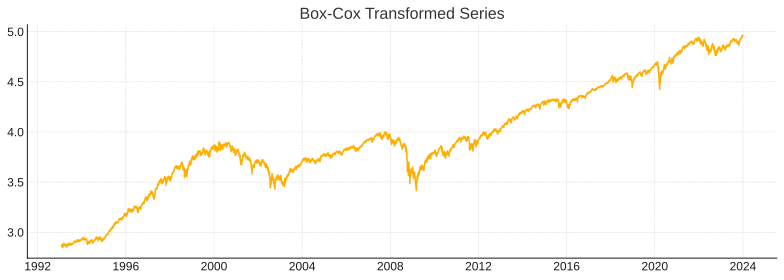

In [8]:
# Perform Box-Cox transformation
transformed_series, lambda_value = boxcox(train["Close"])
print(f'Optimal Lambda: {lambda_value}')

# Plot transformed series
plt.figure(figsize=(11, 4))
plt.plot(train['date'], transformed_series)
plt.title('Box-Cox Transformed Series')
plt.tight_layout()
plt.show()

In [12]:
model_original = SimpleExpSmoothing(train["Close"].to_pandas()).fit()
# forecast_original = model_original.forecast(steps=12)

# Calculate AIC/BIC
aic_original = model_original.aic
bic_original = model_original.bic
print(f"Original Series: AIC={aic_original}, BIC={bic_original}")

Original Series: AIC=10848.707918432545, BIC=10862.628083488886


In [13]:
model_transformed = SimpleExpSmoothing(transformed_series).fit()
# forecast_original = model_original.forecast(steps=12)

# Calculate AIC/BIC
aic_transformed = model_transformed.aic
bic_transformed = model_transformed.bic
print(f"Transformed Series: AIC={aic_transformed}, BIC={bic_transformed}")

Transformed Series: AIC=-74364.73304958692, BIC=-74350.81288453059


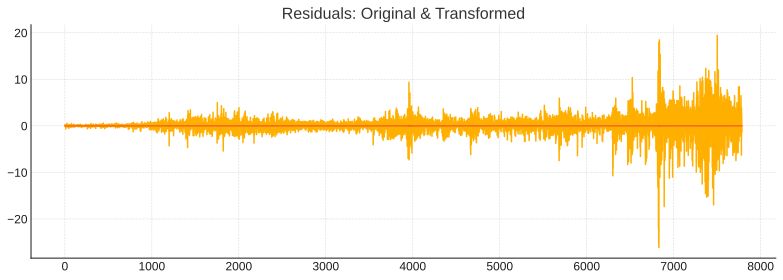

In [18]:
residuals_original = train['Close'].to_pandas() - model_original.fittedvalues
residuals_transformed = transformed_series - model_transformed.fittedvalues

# Plot residuals
plt.figure(figsize=(11, 4))
plt.subplot(1, 2, 1)
plt.scatter(range(len(train['date'])), residuals_original)
plt.title('Residuals: Original')

plt.subplot(1, 2, 2)
plt.scatter(range(len(train['date'])), residuals_transformed)
plt.title('Residuals: Transformed')
plt.tight_layout()
plt.show()

# Plot rolling statistics
plt.figure(figsize=(11, 4))
plt.plot(range(len(train['date'])), residuals_original, label='Residuals: Original')
plt.plot(range(len(train['date'])), residuals_transformed, label='Residuals: Transformed')
plt.title('Residuals: Original & Transformed')
plt.tight_layout()
plt.show()

    - Since there is a significant difference in the information criterions we should take the transformed data from here on out.
    - This is also can be seen by the models performance, even though heteroxcedasticity still persists the performance increased significantly.

In [9]:
train = train.with_columns(pl.Series('tclose', transformed_series))

#### Lambda used:

    -0.07279992892834346

## Outlier detection:

In [10]:
atest = train.clone().to_pandas().set_index('date')
series = atest['tclose']

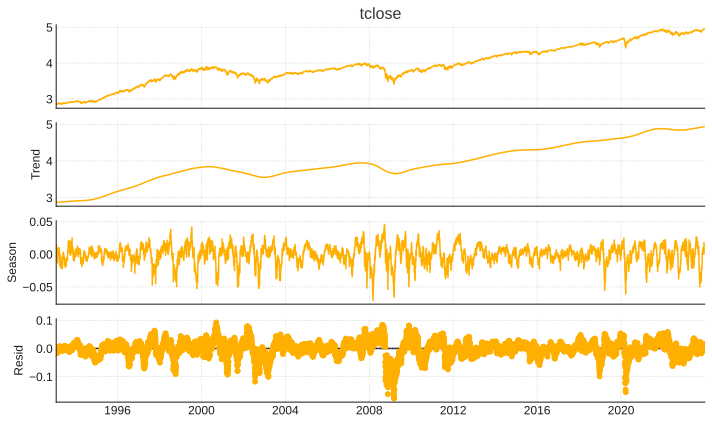

In [11]:
stl = STL(series, period=252).fit()
stl.plot()
plt.show()

### Rolling z-score:

In [12]:
z_score = (stl.resid - stl.resid.rolling(window=90).mean()) / stl.resid.rolling(window=90).std()
train = train.with_columns(pl.Series('z_score', z_score))
train['z_score'].describe().to_pandas().T

,0,1,2,3,4,5,6,7,8
statistic,count,null_count,mean,std,min,25%,50%,75%,max
value,7697.0,89.0,0.054043,1.296516,-6.05694,-0.872652,0.13971,1.046198,4.503136


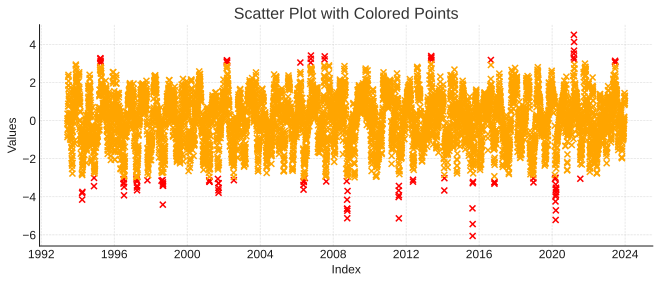

In [18]:
color_conditions = [
    (z_score < -3) | (z_score > 3),
    (z_score >= -3) & (z_score <= 3)
]
colors = ['red', 'orange']

plt.figure(figsize=(11, 4))

for condition, color in zip(color_conditions, colors):
    plt.scatter(z_score[condition].index, z_score[condition], color=color, label=f'{color} points')

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Scatter Plot with Colored Points')
plt.show()

In [13]:
anomalies = z_score[(z_score > 3) | (z_score < -3)].index
regular = z_score[(z_score <= 3) & (z_score >= -3)].index

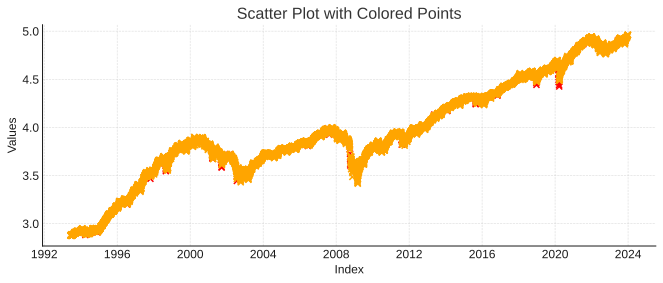

In [20]:
color_conditions = [
    anomalies,
    regular
]
colors = ['red', 'orange']

plt.figure(figsize=(11, 4))

for condition, color in zip(color_conditions, colors):
    plt.scatter(series[condition].index, series[condition], color=color, label=f'{color} points')

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Scatter Plot with Colored Points')
plt.show()

In [14]:
series.loc[anomalies] = np.nan
series = series.interpolate(method='linear')

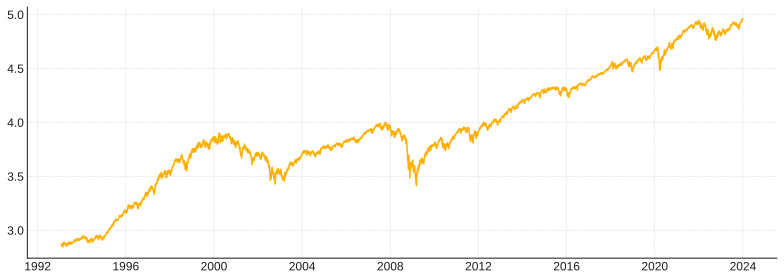

In [22]:
plt.figure(figsize=(11, 4))
plt.plot(series)
plt.tight_layout()
plt.show()

In [15]:
train = train.with_columns(
    (pl.Series(series)).alias('tclose_adjusted')
)

In [16]:
train['tclose_adjusted'].describe().to_pandas().T

,0,1,2,3,4,5,6,7,8
statistic,count,null_count,mean,std,min,25%,50%,75%,max
value,7786.0,0.0,3.942632,0.531672,2.847413,3.654649,3.85774,4.322412,4.962423


Z-score of every value in the residual series we got from the STL decomposition shows that there are some values that can be considered anomalies, so we just fill those values using the linear method.

## Unit root tests:
    - Here we will be analyzing the data to see if the data is stationary for sure.
    - We will also be analyzing the data to see if the data is seasonal for sure.

In [28]:
def adf_results(data, series):
    for r in ["c", "ct"]:
        adf_result = adfuller(data[series], regression=r, autolag='BIC')
    
        print(f'Augmented Dickey-Fuller Test: {r}')
        print(f'ADF Statistic: {adf_result[0]}')
        print(f'p-value: {adf_result[1]} \n')

In [36]:
def kpss_results(data, series):
    for r in ["c", "ct"]:
        kpss_result = kpss(data[series], regression='c', nlags="auto")
        
        print(f'KPSS Test: {r}')
        print(f'KPSS Statistic: {kpss_result[0]}')
        print(f'p-value: {kpss_result[1]} \n')

In [40]:
def acf_pacf(data, series, lags1, lags2):
    plot_acf(data[series], lags=lags1)
    plt.xlabel('Lags', fontsize=12)
    plt.ylabel('AC', fontsize=12)
    plt.show()
    plot_pacf(data[series], lags=lags2)
    plt.xlabel('Lags', fontsize=12)
    plt.ylabel('PAC', fontsize=12)
    plt.show()

In [27]:
def time_series_plot(data, series):
    plt.figure(figsize=(11, 4))
    plt.plot(data['date'], data[series])
    plt.tight_layout()
    plt.show()

In [44]:
def decompose_plot(data, series, period):
    stl = seasonal_decompose(data[series], period=period)
    stl.plot()
    plt.show()
    return stl

In [55]:
def unit_root_test(data, series, lags1, lags2, period):
    
    time_series_plot(data, series)
    decompose_plot(data, series, period)
    acf_pacf(data, series, lags1, lags2)
    
    adf_results(data, series)
    kpss_results(data, series)

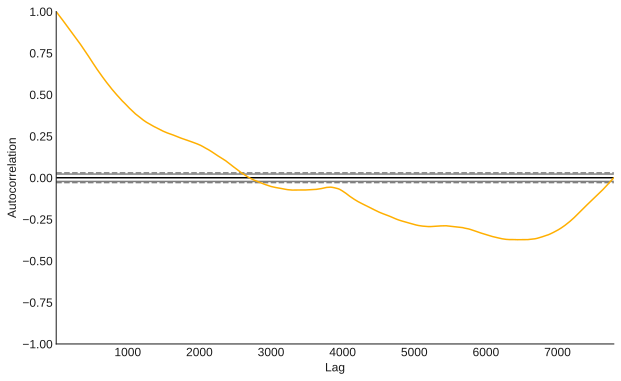

In [53]:
autocorrelation_plot(train['tclose_adjusted'])
plt.show()

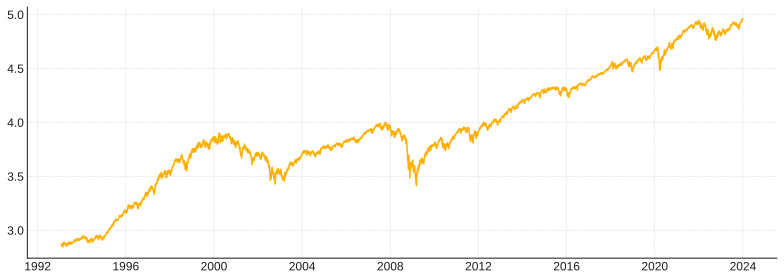

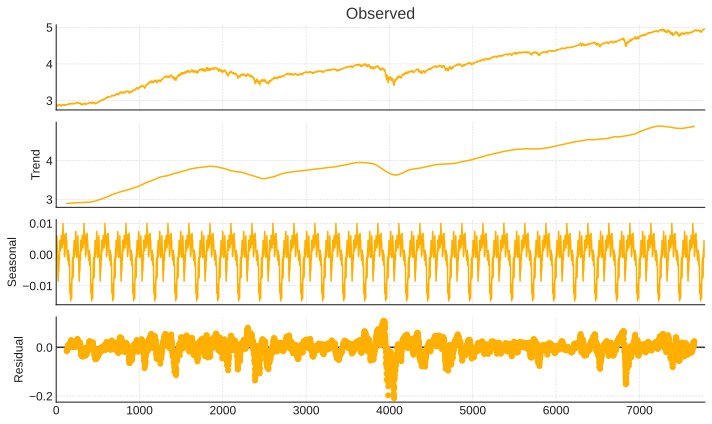

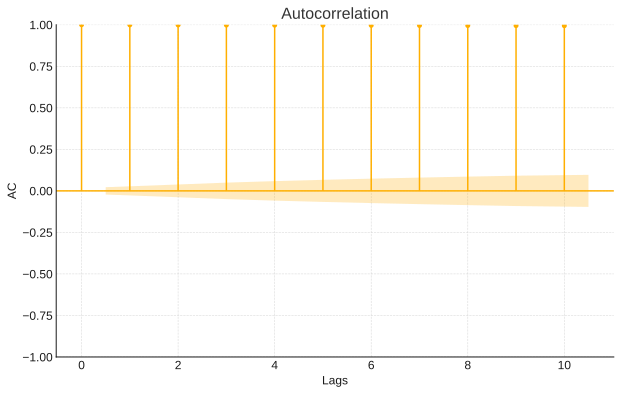

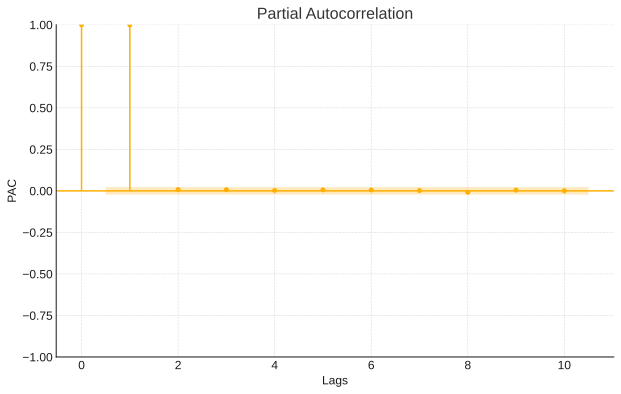

Augmented Dickey-Fuller Test: c
ADF Statistic: -0.787659945559316
p-value: 0.8227200182102461 

Augmented Dickey-Fuller Test: ct
ADF Statistic: -1.9622335514573441
p-value: 0.6218462629422498 

KPSS Test: c
KPSS Statistic: 12.372884995033631
p-value: 0.01 

KPSS Test: ct
KPSS Statistic: 12.372884995033631
p-value: 0.01 



In [56]:
unit_root_test(train, 'tclose_adjusted', 10, 10, 252)

In [15]:
stat, pvalues = hegy_test(train['tclose_adjusted'], 252, True, True) # 252 for seasonal dummies since there are around 252 trading days a year

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.049
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     1.462
Date:                Thu, 05 Dec 2024   Prob (F-statistic):           3.67e-06
Time:                        20:24:35   Log-Likelihood:                 26055.
No. Observations:                7498   AIC:                        -5.160e+04
Df Residuals:                    7244   BIC:                        -4.984e+04
Df Model:                         253                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0044      0.002      2.

    - As we have guessed the data is not stationary since the decay in the acf plot is not exponantial instead it is linear.
    - As for the Seasonality from the last ACF graph we can see that the although the ACF shows a linear decay it still shows an seasonal behaviour over a long time.

For method 'c' adf test

Null Hypothesis (H₀): The time series is non-stationary, indicating a unit root. \
Alternative Hypothesis (H₁): The time series is stationary (it does not have a unit root).

- This result shows that the series is non-stationary.

For method 'c' kpss test

Null Hypothesis (H₀): The time series is stationary (it does not have a unit root). \
Alternative Hypothesis (H₁): The time series is non-stationary, indicating a unit root.

- This result shows that thhe series is non-stationary.

for method 'ct' adf test

Null Hypothesis (H₀): The time series has a stochastic trend, indicating a unit root. \
Alternative Hypothesis (H₁): The time series has a deterministic trend (it does not have a unit root).

- This result shows us a stochastic trend.

for method 'ct' kpss test

Null Hypothesis (H₀): The time series has a deterministic trend. \
Alternative Hypothesis (H₁): The time series has a stochastic trend.

- This result shows us a stochastic trend.

### Judging by the coefficients and the p-values(i.e. our confidence in the values) and the seasonal decomposition:

- Coef for the constant is 0.0044 and the p value for it is 0.013 below 5% so there is probably a constant.
- Coef for the trend is $2.805 * 10^{-7}$ and the p value for it is 0.029 below 5% so there is probably a trend.

 Since we are doing the regression on an differenced series like we do in ADF test, constant's and trend's coefs being non-zero means that the series is non-stationary and has both a trend and a constant.

- We can see that the data has sesaonality both by taking a look at the summary from the Ordinary Least Squares(OLS) model especially the coefs of the last few seasonal dummies, and we can also see the seasonality from the seasoal decomposition.

### Decision:

- We need to take at least one regular difference and at least one seasonal difference

## Removing the trend:
- Since the data is not stationary we need to make the data stationary to work on it with ARIMA models.
- In this step We will be differencing the data and visualizing it again and interpret it again.

In [58]:
train = train.with_columns(
    pl.col("tclose_adjusted").diff().alias("tclose_diff")
)

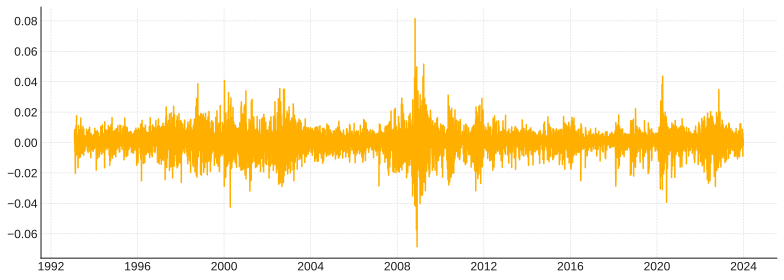

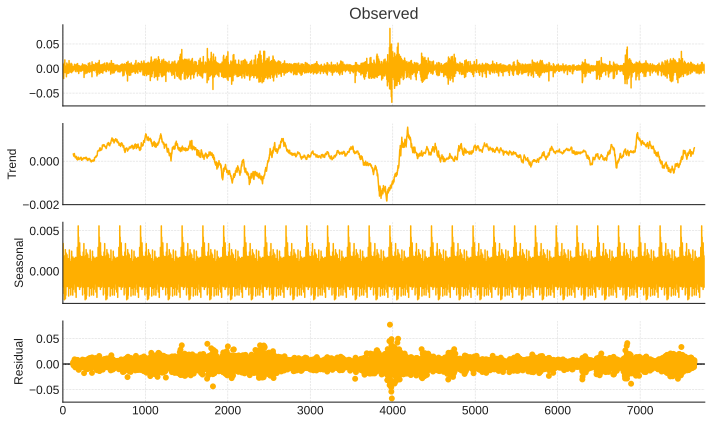

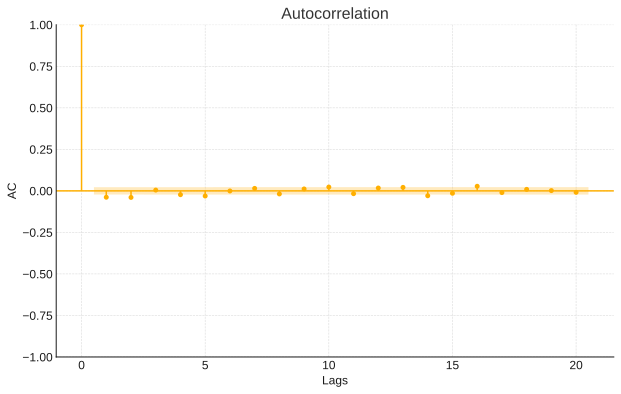

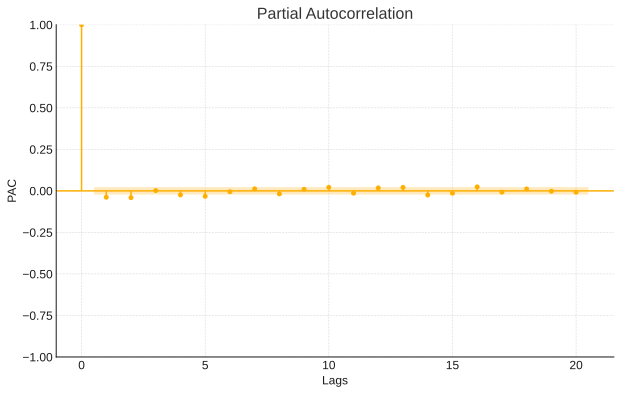

Augmented Dickey-Fuller Test: c
ADF Statistic: -66.21042802497882
p-value: 0.0 

Augmented Dickey-Fuller Test: ct
ADF Statistic: -66.20649913923071
p-value: 0.0 

KPSS Test: c
KPSS Statistic: 0.10679436705087385
p-value: 0.1 

KPSS Test: ct
KPSS Statistic: 0.10679436705087385
p-value: 0.1 



In [61]:
unit_root_test(train[1:], 'tclose_diff', 20, 20, 252)

In [62]:
stat, pvalues = hegy_test(train['tclose_diff'][1:], 252, True, True)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.542
Model:                            OLS   Adj. R-squared:                  0.526
Method:                 Least Squares   F-statistic:                     33.85
Date:                Sun, 08 Dec 2024   Prob (F-statistic):               0.00
Time:                        13:12:00   Log-Likelihood:                 25841.
No. Observations:                7497   AIC:                        -5.117e+04
Df Residuals:                    7243   BIC:                        -4.942e+04
Df Model:                         253                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0003      0.000      1.

It looks like differencing got rid of both the constant term and also the time parameter.

Just by looking at the ACF and the PACF plots the data seems to be stationary. Let's see the tests and the seasonal decomposition.

We see that there is no constant and also no trend in the differenced data from the coefs and their p-values but the seasonal dummies' coefs and p-values tells us that the seasonal trend is still there.

As we have guessed from the OLS the seasonality is still there.

### Interpretation:

- The tests shows that the data is stationary after taking a regular diff but the seasonal trend is still there, but since it is unusual for a data to need more than one regular differencing the let's try the sesaonal difference and see if that makes the data stationary if that doesn't work either than we can try regular and seasonal differencing together.

In [65]:
train = train.with_columns(
    pl.col("tclose_adjusted").diff(252).alias("tclose_seasonal_diff")
)

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

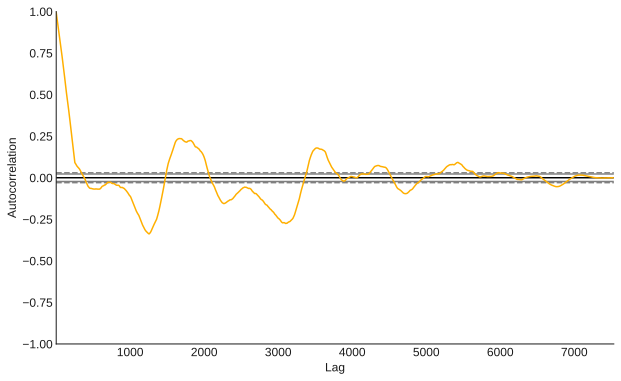

In [45]:
autocorrelation_plot(train['tclose_seasonal_diff'][252:])

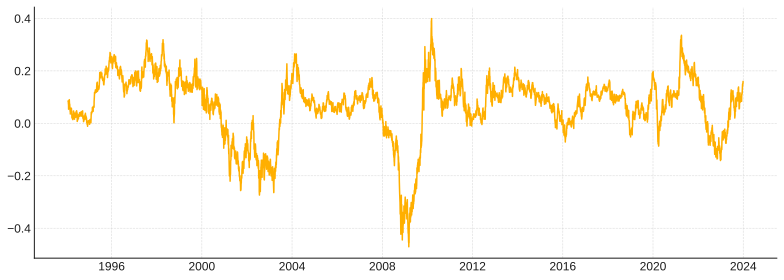

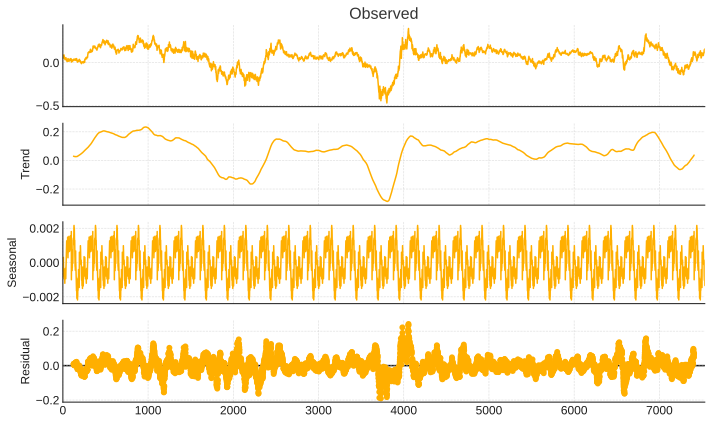

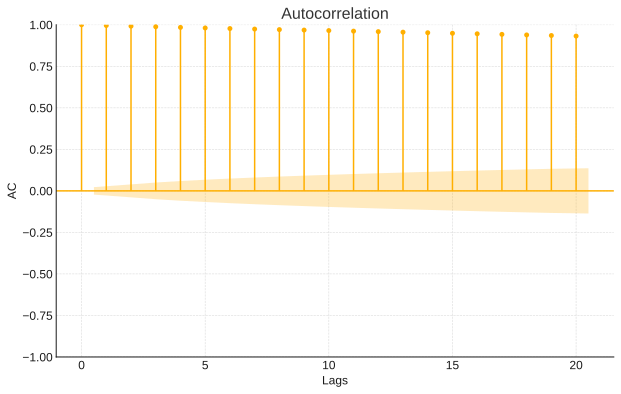

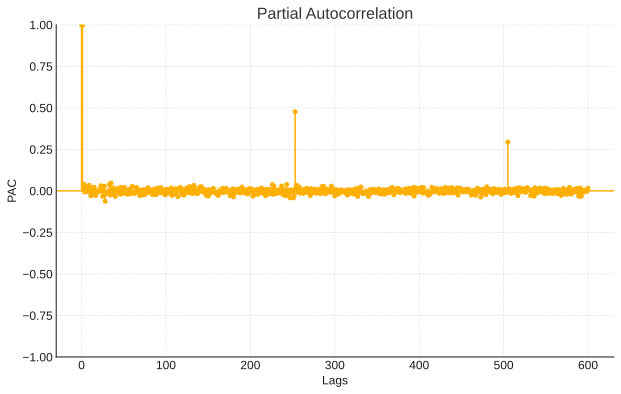

Augmented Dickey-Fuller Test: c
ADF Statistic: -3.6968467343329228
p-value: 0.004157726896479248 

Augmented Dickey-Fuller Test: ct
ADF Statistic: -3.69028922261018
p-value: 0.02300475246130614 

KPSS Test: c
KPSS Statistic: 0.4584714927730127
p-value: 0.05195194277025316 

KPSS Test: ct
KPSS Statistic: 0.4584714927730127
p-value: 0.05195194277025316 



In [66]:
unit_root_test(train[252:], 'tclose_seasonal_diff', 20, 600, 252)

In [67]:
stat, pvalues = hegy_test(train['tclose_seasonal_diff'][252:], 252, True, True)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.077
Model:                            OLS   Adj. R-squared:                  0.043
Method:                 Least Squares   F-statistic:                     2.299
Date:                Sun, 08 Dec 2024   Prob (F-statistic):           2.53e-26
Time:                        13:15:26   Log-Likelihood:                 22488.
No. Observations:                7246   AIC:                        -4.447e+04
Df Residuals:                    6992   BIC:                        -4.272e+04
Df Model:                         253                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0006      0.000      2.

Similar to the regular difference there is no constant term and also no time parameter.

ACF shows that with only seasonal differencing the data stays non-stationary.

We see that there is no constant and also no trend in the differenced data from the coefs and their p-values but the seasonal dummies' coefs and p-values tells us that the seasonal trend is still there just like the regular differenced series.

As we have guessed from the OLS the seasonal trend is still there.

In [48]:
train = train.with_columns(
    pl.col("tclose_adjusted").diff(252).diff().alias("tclose_sdiff_diff")
)

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

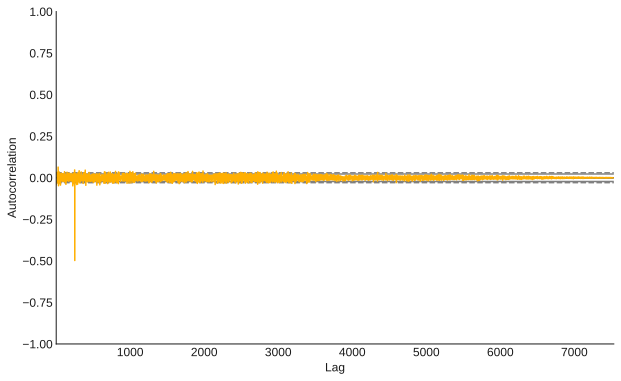

In [62]:
autocorrelation_plot(train['tclose_sdiff_diff'][253:])

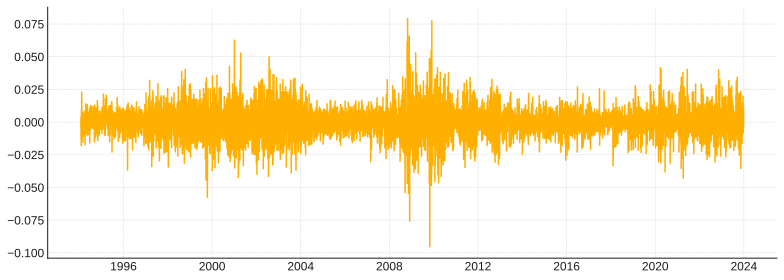

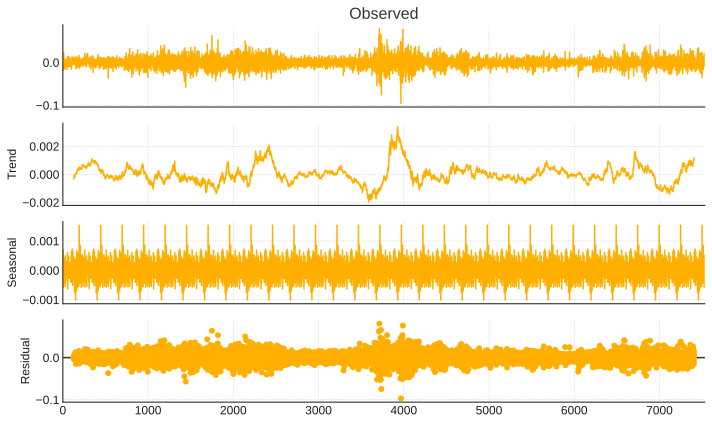

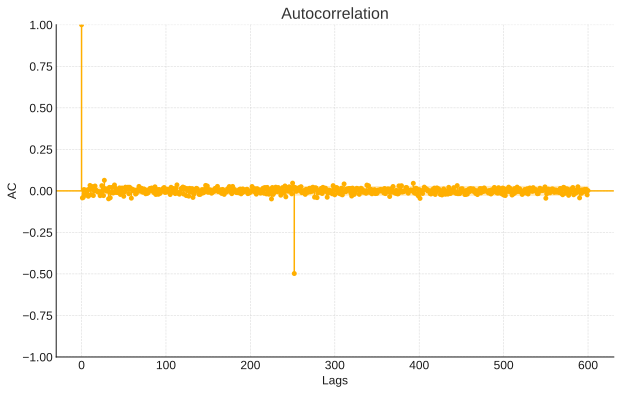

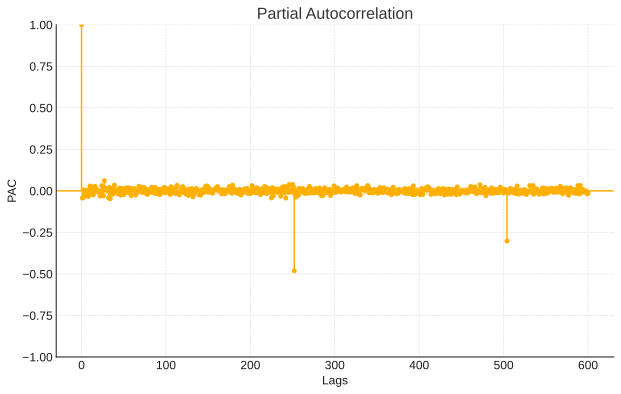

Augmented Dickey-Fuller Test: c
ADF Statistic: -65.27560090872092
p-value: 0.0 

Augmented Dickey-Fuller Test: ct
ADF Statistic: -65.27182564391973
p-value: 0.0 

KPSS Test: c
KPSS Statistic: 0.025079665763232787
p-value: 0.1 

KPSS Test: ct
KPSS Statistic: 0.025079665763232787
p-value: 0.1 



In [68]:
unit_root_test(train[253:], 'tclose_sdiff_diff', 600, 600, 252)

In [70]:
stat, pvalues = hegy_test(train['tclose_sdiff_diff'][253:], 252, True, True)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.663
Model:                            OLS   Adj. R-squared:                  0.651
Method:                 Least Squares   F-statistic:                     54.38
Date:                Sun, 08 Dec 2024   Prob (F-statistic):               0.00
Time:                        13:18:43   Log-Likelihood:                 23477.
No. Observations:                7245   AIC:                        -4.645e+04
Df Residuals:                    6991   BIC:                        -4.470e+04
Df Model:                         253                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -7.923e-08      0.000     -0.

So far there the series seems stationary and also the seasonal trend is gone for both the ACF and the PACF plot but let's still look at the test results.

Looking at the test results also tells us that the data is stationary and the seasonal trend is taken care of, now we can move on to sellecting the right SARIMA model for the series.

## Model selection:

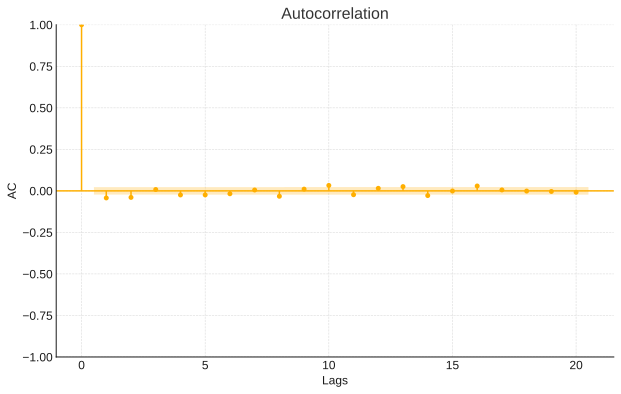

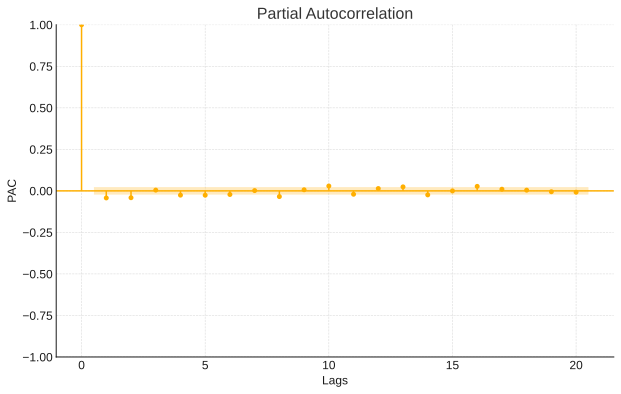

In [52]:
acf_pacf(train[253:], 'tclose_sdiff_diff', 20, 20)

Lags cut of after the zeroth lag, this tells us that the series behaves like white noise. In this case we can't make a correct judgement for the AR and the MA parameters of the SARIMA model. This also means that the model is not-invertible and doesn't have any memory. In this case there is two possible ways we can proceed one being we put 0 for both the AR and MA process making the model mostly random, which is not optimal, or we can take a fractional difference and keep some of the memory while still making the series stationary.

For now we will be using the first option.

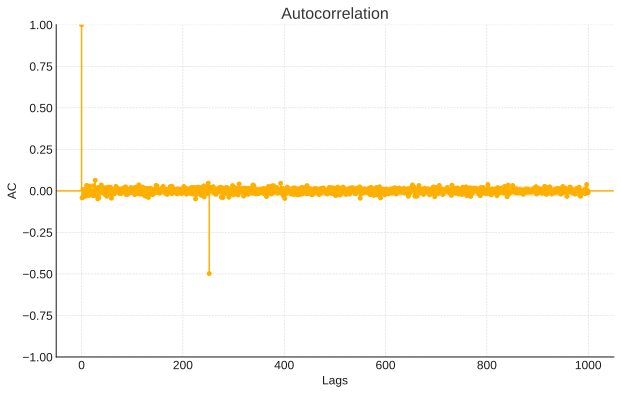

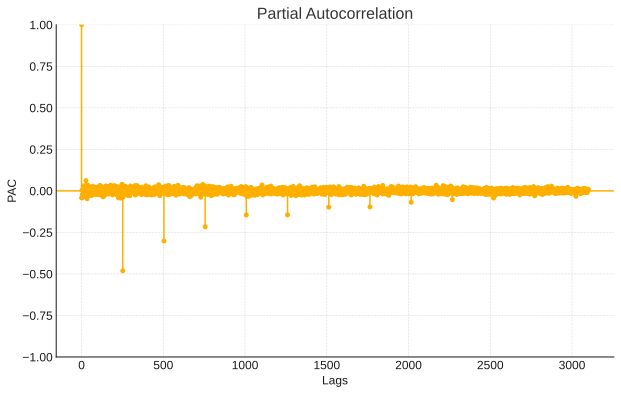

In [71]:
acf_pacf(train[253:], 'tclose_sdiff_diff', 1000, 3100)

As for the Seasonal parameters of the SARIMA model we can look at the lags at 252k k $\geq$ 1 at the ACF and PACF plots. From ACF plot it is clear that the SMA parameter is 1 as for SAR it is 0 since the values tails off in the PACF plot.

### Final decission:

The parameter of the model is probably SARIMA(0,1,0)$*$(0,1,1,252), but we will also try SARIMA(1,1,1)$*$(0,1,1,252), SARIMA(0,1,3)$*$(0,1,1,252), SARIMA(1,1,3)$*$(0,1,1,252), and SARIMA(0,1,0)$*$(0,1,1,252)